$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\cset}[1]{\mathcal{#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bb}[1]{\boldsymbol{#1}}
\newcommand{\E}[2][]{\mathbb{E}_{#1}\left[#2\right]}
\newcommand{\ip}[3]{\left<#1,#2\right>_{#3}}
\newcommand{\given}[]{\,\middle\vert\,}
\newcommand{\DKL}[2]{\cset{D}_{\text{KL}}\left(#1\,\Vert\, #2\right)}
\newcommand{\grad}[]{\nabla}
$$

# Part 3: Mini-Project
<a id=part3></a>

In this part you'll implement a small comparative-analysis project, heavily based on the materials from the tutorials and homework.

You must **choose one** of the project options specified below.

### Guidelines

- You should implement the code which displays your results in this notebook, and add any additional code files for your implementation in the `project/` directory. You can import these files here, as we do for the homeworks.
- Running this notebook should not perform any training - load your results from some output files and display them here. The notebook must be runnable from start to end without errors.
- You must include a detailed write-up (in the notebook) of what you implemented and how. 
- Explain the structure of your code and how to run it to reproduce your results.
- Explicitly state any external code you used, including built-in pytorch models and code from the course tutorials/homework.
- Analyze your numerical results, explaining **why** you got these results (not just specifying the results).
- Where relevant, place all results in a table or display them using a graph.
- Before submitting, make sure all files which are required to run this notebook are included in the generated submission zip.
- Try to keep the submission file size under 10MB. Do not include model checkpoint files, dataset files, or any other non-essentials files. Instead include your results as images/text files/pickles/etc, and load them for display in this notebook. 

## Sentiment Analysis with Self-Attention and Word Embeddings

Based on Tutorials 6 and 7, we'll implement and train an improved sentiment analysis model.
We'll use self-attention instead of RNNs and incorporate pre-trained word embeddings.

In tutorial 6 we saw that we can train word embeddings together with the model.
Although this produces embeddings which are customized to the specific task at hand,
it also greatly increases training time.
A common technique is to use pre-trained word embeddings.
This is essentially a large mapping from words (e.g. in english) to some
high-dimensional vector, such that semantically similar words have an embedding that is
"close" by some metric (e.g. cosine distance).
Use the [GloVe](https://nlp.stanford.edu/projects/glove/) 6B embeddings for this purpose.
You can load these vectors into the weights of an `nn.Embedding` layer.

In tutorial 7 we learned how attention can be used to learn to predict a relative importance
for each element in a sequence, compared to the other elements.
Here, we'll replace the RNN with self-attention only approach similar to Transformer models, roughly based on [this paper](https://www.aclweb.org/anthology/W18-6219.pdf).
After embedding each word in the sentence using the pre-trained word-embedding a positional-encoding vector is added to provide each word in the sentence a unique value based on it's location.
One or more self-attention layers are then applied to the results, to obtain an importance weighting for each word.
Then we classify the sentence based on the average these weighted encodings.


Now, using these approaches, you need to:

- Implement a **baseline** model: Use pre-trained embeddings with an RNN-based model.
You can use LSTM/GRU or bi-directional versions of these, in a way very similar to what we implemented in the tutorial.
-  Implement an **improved** model: Based on the self-attention approach, implement an attention-based sentiment analysis model that has 1-2 self-attention layers instead of an RNN. You should use the same pre-trained word embeddings for this model.
- You can use pytorch's built-in RNNs, attention layers, etc.
- For positional encoding you can use the sinosoidal approach described in the paper (first proposed [here](https://arxiv.org/pdf/1706.03762.pdf)). You can use existing online implementations (even though it's straightforward to implement). 
- You can use the SST database as shown in the tutorial.

Your results should include:
- Everything written in the **Guidelines** above.
- A comparative analysis: compare the baseline to the improved model. Compare in terms of overall classification accuracy and show a multiclass confusion matrix.
- Visualize of the attention maps for a few movie reviews from each class, and explain the results.

## Spectrally-Normalized Wasserstein GANs

In HW3 we implemented a simple GANs from scratch, using an approach very similar to the original GAN paper. However, the results left much to be desired and we discovered first-hand how hard it is to train GANs due to their inherent instability.

One of the prevailing approaches for improving training stability for GANs is to use a technique called [Spectral Normalization](https://arxiv.org/pdf/1802.05957.pdf) to normalize the largest singular value of a weight matrix so that it equals 1.
This approach is generally applied to the discriminator's weights in order to stabilize training. The resulting model is sometimes referred to as a SN-GAN.
See Appendix A in the linked paper for the exact algorithm. You can also use pytorch's `spectral_norm`.

Another very common improvement to the vanilla GAN is known a [Wasserstein GAN](https://arxiv.org/pdf/1701.07875.pdf) (WGAN). It uses a simple modification to the loss function, with strong theoretical justifications based on the Wasserstein (earth-mover's) distance.
See also [here](https://developers.google.com/machine-learning/gan/loss) for a brief explanation of this loss function.

One problem with generative models for images is that it's difficult to objectively assess the quality of the resulting images.
To also obtain a quantitative score for the images generated by each model,
we'll use the [Inception Score](https://arxiv.org/pdf/1606.03498.pdf).
This uses a pre-trained Inception CNN model on the generated images and computes a score based on the predicted probability for each class.
Although not a perfect proxy for subjective quality, it's commonly used a way to compare generative models.
You can use an implementation of this score that you find online, e.g. [this one](https://github.com/sbarratt/inception-score-pytorch) or implement it yourself.

Based on the linked papers, add Spectral Normalization and the Wassertein loss to your GAN from HW3.
Compare between:
- The baseline model (vanilla GAN)
- SN-GAN (vanilla + Spectral Normalization)
- WGAN (using Wasserstein Loss)
- Optional: SN+WGAN, i.e. a combined model using both modifications.

As a dataset, you can use [LFW](http://vis-www.cs.umass.edu/lfw/) as in HW3 or [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html), or even choose a custom dataset (note that there's a dataloder for CelebA in `torchvision`). 

Your results should include:
- Everything written in the **Guidelines** above.
- A comparative analysis between the baseline and the other models. Compare:
  - Subjective quality (show multiple generated images from each model)
  - Inception score (can use a subset of the data).
- You should show substantially improved subjective visual results with these techniques.

## Implementation

**TODO**: This is where you should write your explanations and implement the code to display the results.
See guidelines about what to include in this section.

In [1]:
import unittest
import os
import sys
import pathlib
import urllib
import shutil
import re
import zipfile

import numpy as np
import torch
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

test = unittest.TestCase()
plt.rcParams.update({'font.size': 12})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


In [ ]:
import cs236781.plot as plot
import cs236781.download

DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')
DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'

_, dataset_dir = cs236781.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

In [ ]:
import torchvision.transforms as T
from torchvision.datasets import ImageFolder

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)

In [ ]:
import torch.optim as optim
from torch.utils.data import DataLoader
from project.hyperparams import gan_hyperparams
from project import gan
torch.manual_seed(42)

# Hyperparams
hp = gan_hyperparams()
batch_size = hp['batch_size']
z_dim = hp['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan.SNDiscriminator(im_size).to(device)
gen = gan.Generator(z_dim, featuremap_size=4).to(device)

# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    return optim.__dict__[optimizer_type](model_params, **opt_params)
dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])
gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return optim.discriminator_loss_fn(y_data, y_generated, hp['data_label'], hp['label_noise'])

def gen_loss_fn(y_generated):
    return gan.generator_loss_fn(y_generated, hp['data_label'])

# Training
checkpoint_file = 'checkpoints/gan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hp)

In [ ]:
import IPython.display
import tqdm
from project.gan import train_batch, save_checkpoint

num_epochs = 100

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_batch(
                    dsc, gen,
                    dsc_loss_fn, gen_loss_fn,
                    dsc_optimizer, gen_optimizer,
                    x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = gen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)
        plt.close(fig)
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')

In [ ]:
print(dsc, gen)

In [27]:
from project.hyperparams import *
from project.train import *

{'batch_size': 53, 'z_dim': 100, 'data_label': 1, 'label_noise': 0.1, 'discriminator_optimizer': {'type': 'RMSprop', 'lr': 0.0005}, 'generator_optimizer': {'type': 'RMSprop', 'lr': 0.0005}, 'n_critic': 5, 'c': 0.01}
File /home/ofir.s/.pytorch-datasets/lfw-bush.zip exists, skipping download.
Extracting /home/ofir.s/.pytorch-datasets/lfw-bush.zip...
Extracted 531 to /home/ofir.s/.pytorch-datasets/lfw/George_W_Bush
Generator(
  (decoder): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-0

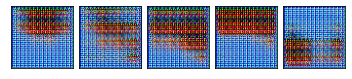

--- EPOCH 2/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.76it/s]
Discriminator loss: -1.2571169865131377
Generator loss:     0.720212984085083


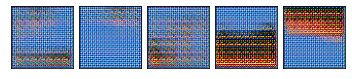

--- EPOCH 3/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -1.387184953689575
Generator loss:     0.7550096690654755


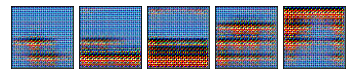

--- EPOCH 4/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -1.419047203063965
Generator loss:     0.7550150454044342


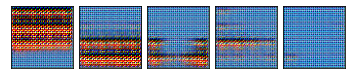

--- EPOCH 5/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.70it/s]
Discriminator loss: -1.4350523471832275
Generator loss:     0.7457842409610749


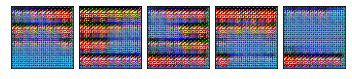

--- EPOCH 6/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.76it/s]
Discriminator loss: -1.3262312042713165
Generator loss:     0.6996174961328506


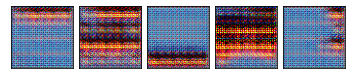

--- EPOCH 7/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.78it/s]
Discriminator loss: -1.2230577337741853
Generator loss:     0.6269480943679809


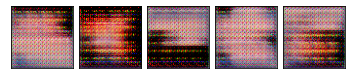

--- EPOCH 8/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
Discriminator loss: -0.7305634167790412
Generator loss:     0.44826471358537673


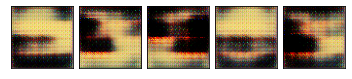

--- EPOCH 9/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.77it/s]
Discriminator loss: -1.0220827096700669
Generator loss:     0.5844458609819412


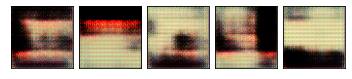

--- EPOCH 10/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.65it/s]
Discriminator loss: -1.0734730625152589
Generator loss:     0.5730243921279907


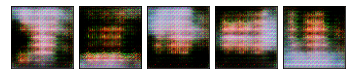

--- EPOCH 11/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -1.0093357533216476
Generator loss:     0.6154858112335205


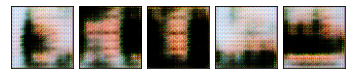

--- EPOCH 12/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.74it/s]
Discriminator loss: -1.168598003387451
Generator loss:     0.661064875125885


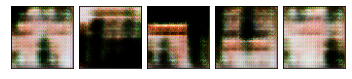

--- EPOCH 13/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -1.1078927534818648
Generator loss:     0.6552796244621277


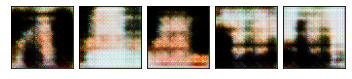

--- EPOCH 14/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.72it/s]
Discriminator loss: -1.13446222782135
Generator loss:     0.6378331303596496


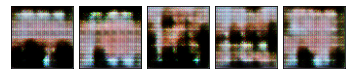

--- EPOCH 15/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -1.0353013211488724
Generator loss:     0.6354245960712432


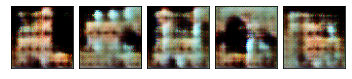

--- EPOCH 16/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -1.153472843170166
Generator loss:     0.6567117154598237


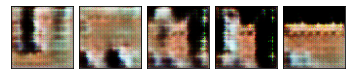

--- EPOCH 17/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.59it/s]
Discriminator loss: -1.088996591567993
Generator loss:     0.6457979440689087


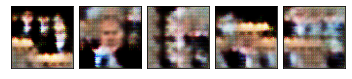

--- EPOCH 18/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.65it/s]
Discriminator loss: -1.0733404862880707
Generator loss:     0.6360106766223907


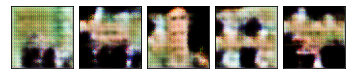

--- EPOCH 19/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.73it/s]
Discriminator loss: -1.0917950600385664
Generator loss:     0.633608466386795


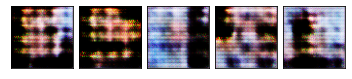

--- EPOCH 20/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -0.9626133072376252
Generator loss:     0.6103143393993378


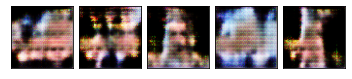

--- EPOCH 21/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.72it/s]
Discriminator loss: -1.0126403510570525
Generator loss:     0.5981613144278526


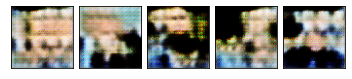

--- EPOCH 22/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -1.009918300509453
Generator loss:     0.6487398564815521


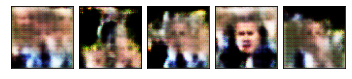

--- EPOCH 23/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -1.0513332486152647
Generator loss:     0.6350431263446807


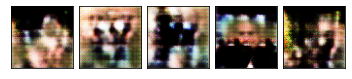

--- EPOCH 24/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.9633031398057936
Generator loss:     0.5725261211395264


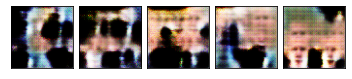

--- EPOCH 25/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
Discriminator loss: -0.9881719791889191
Generator loss:     0.6094264149665832


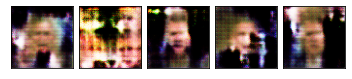

--- EPOCH 26/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.49it/s]
Discriminator loss: -1.0105508613586425
Generator loss:     0.5671214088797569


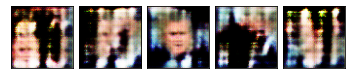

--- EPOCH 27/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
Discriminator loss: -0.9512124460935591
Generator loss:     0.6188741028308868


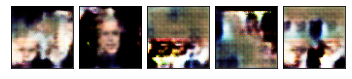

--- EPOCH 28/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -1.003263475894928
Generator loss:     0.6141311526298523


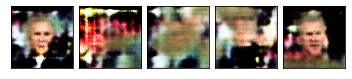

--- EPOCH 29/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.62it/s]
Discriminator loss: -1.0026320141553877
Generator loss:     0.6104834288358688


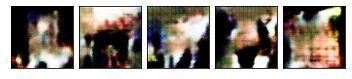

--- EPOCH 30/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.59it/s]
Discriminator loss: -0.9544012236595154
Generator loss:     0.6029546558856964


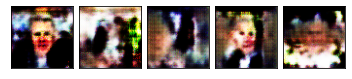

--- EPOCH 31/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.62it/s]
Discriminator loss: -0.9801978206634521
Generator loss:     0.5917563229799271


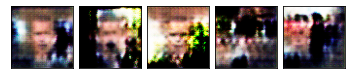

--- EPOCH 32/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.69it/s]
Discriminator loss: -0.8490909302234648
Generator loss:     0.4579064264893532


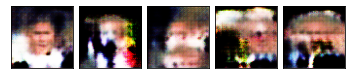

--- EPOCH 33/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.72it/s]
Discriminator loss: -0.9195119178295135
Generator loss:     0.590949809551239


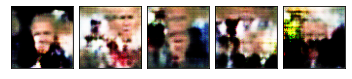

--- EPOCH 34/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.62it/s]
Discriminator loss: -0.9103526794910429
Generator loss:     0.5857783734798432


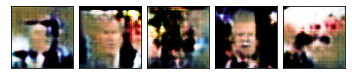

--- EPOCH 35/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.63it/s]
Discriminator loss: -0.9569303119182587
Generator loss:     0.5797485858201981


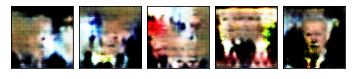

--- EPOCH 36/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -0.9196042490005494
Generator loss:     0.5795592993497849


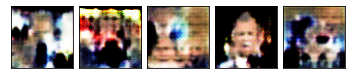

--- EPOCH 37/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.56it/s]
Discriminator loss: -0.9260158252716065
Generator loss:     0.5851183623075485


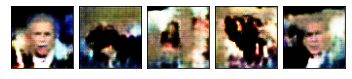

--- EPOCH 38/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.9244655716419219
Generator loss:     0.5635007917881012


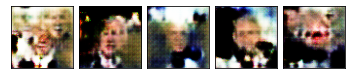

--- EPOCH 39/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.62it/s]
Discriminator loss: -0.9325996309518813
Generator loss:     0.5328651040792465


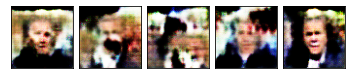

--- EPOCH 40/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.9099753201007843
Generator loss:     0.5811930418014526


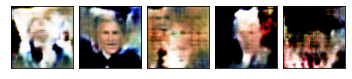

--- EPOCH 41/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
Discriminator loss: -0.8952542388439179
Generator loss:     0.5115235328674317


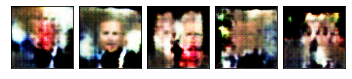

--- EPOCH 42/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.65it/s]
Discriminator loss: -0.8715555763244629
Generator loss:     0.5627184122800827


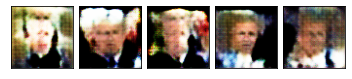

--- EPOCH 43/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.53it/s]
Discriminator loss: -0.8758184397220612
Generator loss:     0.5628439754247665


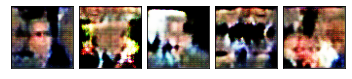

--- EPOCH 44/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.55it/s]
Discriminator loss: -0.8889848762750626
Generator loss:     0.5525526285171509


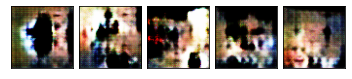

--- EPOCH 45/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
Discriminator loss: -0.8834995418787003
Generator loss:     0.5661731839179993


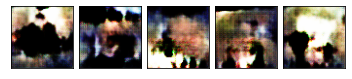

--- EPOCH 46/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.57it/s]
Discriminator loss: -0.888683408498764
Generator loss:     0.5630654215812683


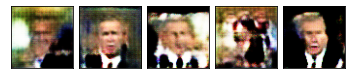

--- EPOCH 47/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.64it/s]
Discriminator loss: -0.8432630825042725
Generator loss:     0.5343302369117737


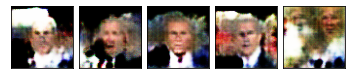

--- EPOCH 48/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.886782373189926
Generator loss:     0.5523242384195328


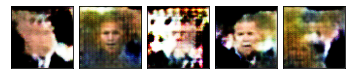

--- EPOCH 49/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.64it/s]
Discriminator loss: -0.8724805462360383
Generator loss:     0.5548398405313492


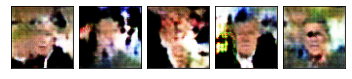

--- EPOCH 50/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.69it/s]
Discriminator loss: -0.86780215382576
Generator loss:     0.5458387196063995


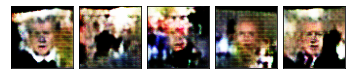

--- EPOCH 51/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.59it/s]
Discriminator loss: -0.8635389137268066
Generator loss:     0.5635734260082245


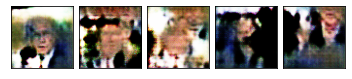

--- EPOCH 52/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.57it/s]
Discriminator loss: -0.8837565135955812
Generator loss:     0.5261150777339936


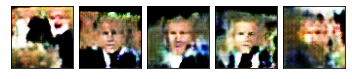

--- EPOCH 53/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -0.8411346679925918
Generator loss:     0.5314789026975631


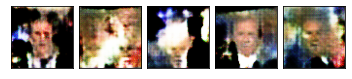

--- EPOCH 54/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.58it/s]
Discriminator loss: -0.8485792225599289
Generator loss:     0.5124541625380516


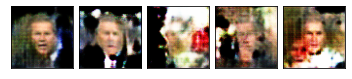

--- EPOCH 55/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.64it/s]
Discriminator loss: -0.8601592057943342
Generator loss:     0.5476409614086151


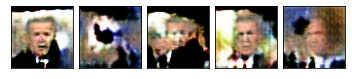

--- EPOCH 56/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.53it/s]
Discriminator loss: -0.855808824300766
Generator loss:     0.5557988256216049


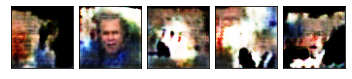

--- EPOCH 57/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.863914526104927
Generator loss:     0.5345612168312073


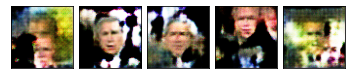

--- EPOCH 58/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.63it/s]
Discriminator loss: -0.8250286054611206
Generator loss:     0.5297075003385544


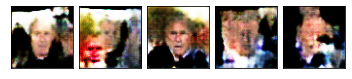

--- EPOCH 59/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.65it/s]
Discriminator loss: -0.8524788868427278
Generator loss:     0.5335191488265991


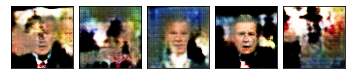

--- EPOCH 60/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.65it/s]
Discriminator loss: -0.8363089776039123
Generator loss:     0.5493783533573151


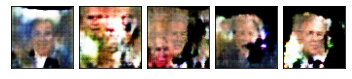

--- EPOCH 61/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.45it/s]
Discriminator loss: -0.8325505590438842
Generator loss:     0.4800581157207489


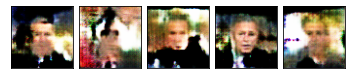

--- EPOCH 62/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.70it/s]
Discriminator loss: -0.8359835243225099
Generator loss:     0.5080023914575577


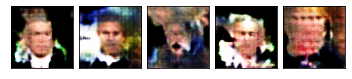

--- EPOCH 63/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.61it/s]
Discriminator loss: -0.8046161150932312
Generator loss:     0.4741700742393732


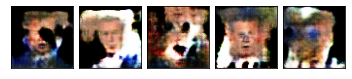

--- EPOCH 64/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.59it/s]
Discriminator loss: -0.8070269870758058
Generator loss:     0.5194832175970078


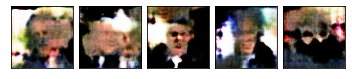

--- EPOCH 65/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.64it/s]
Discriminator loss: -0.812252014875412
Generator loss:     0.5064229488372802


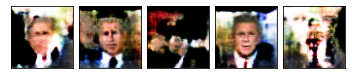

--- EPOCH 66/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.65it/s]
Discriminator loss: -0.8188738095760346
Generator loss:     0.4990897923707962


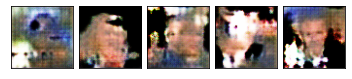

--- EPOCH 67/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.71it/s]
Discriminator loss: -0.8339621788263321
Generator loss:     0.5212338417768478


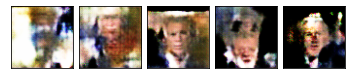

--- EPOCH 68/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.56it/s]
Discriminator loss: -0.8115350228548049
Generator loss:     0.5426868200302124


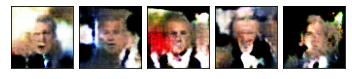

--- EPOCH 69/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.62it/s]
Discriminator loss: -0.8193788027763368
Generator loss:     0.5139701455831528


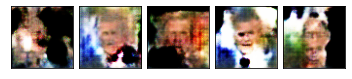

--- EPOCH 70/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.48it/s]
Discriminator loss: -0.8399452316761018
Generator loss:     0.505720642209053


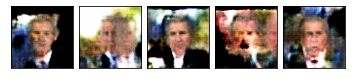

--- EPOCH 71/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.61it/s]
Discriminator loss: -0.7712463361024856
Generator loss:     0.4929510548710823


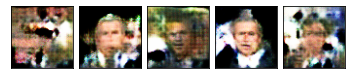

--- EPOCH 72/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.61it/s]
Discriminator loss: -0.8255026710033416
Generator loss:     0.5306712448596954


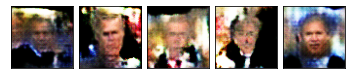

--- EPOCH 73/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.55it/s]
Discriminator loss: -0.8048956495523452
Generator loss:     0.5245524823665619


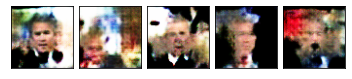

--- EPOCH 74/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.70it/s]
Discriminator loss: -0.7904625242948532
Generator loss:     0.4875136688351631


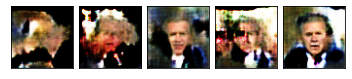

--- EPOCH 75/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.70it/s]
Discriminator loss: -0.8199209517240524
Generator loss:     0.4895184952765703


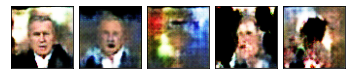

--- EPOCH 76/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
Discriminator loss: -0.7926659274101258
Generator loss:     0.5464150160551071


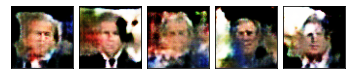

--- EPOCH 77/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
Discriminator loss: -0.7968089336156845
Generator loss:     0.5054070800542831


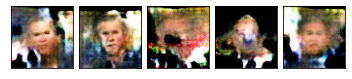

--- EPOCH 78/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.52it/s]
Discriminator loss: -0.7968829661607743
Generator loss:     0.5002155363559723


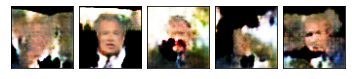

--- EPOCH 79/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.65it/s]
Discriminator loss: -0.7945549619197845
Generator loss:     0.5208190023899079


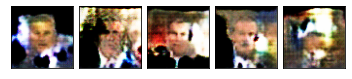

--- EPOCH 80/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.64it/s]
Discriminator loss: -0.7800977635383606
Generator loss:     0.48835869431495665


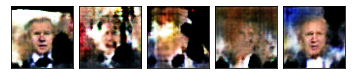

--- EPOCH 81/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.59it/s]
Discriminator loss: -0.8106805396080018
Generator loss:     0.5062277287244796


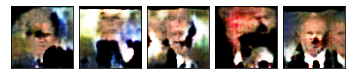

--- EPOCH 82/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
Discriminator loss: -0.7916424375772476
Generator loss:     0.5068213403224945


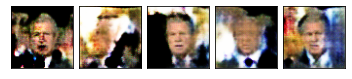

--- EPOCH 83/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.56it/s]
Discriminator loss: -0.7746644616127014
Generator loss:     0.4861545115709305


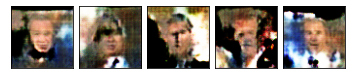

--- EPOCH 84/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.71it/s]
Discriminator loss: -0.8016275751590728
Generator loss:     0.5163798004388809


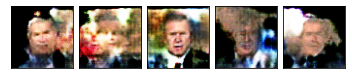

--- EPOCH 85/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.63it/s]
Discriminator loss: -0.8114676713943482
Generator loss:     0.45510229021310805


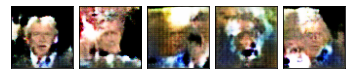

--- EPOCH 86/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.65it/s]
Discriminator loss: -0.7787290406227112
Generator loss:     0.49554588198661803


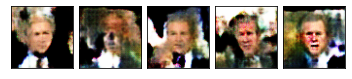

--- EPOCH 87/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.59it/s]
Discriminator loss: -0.7826641929149628
Generator loss:     0.49481326043605806


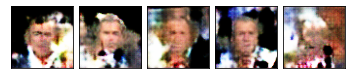

--- EPOCH 88/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.59it/s]
Discriminator loss: -0.7718039852380753
Generator loss:     0.5030351728200912


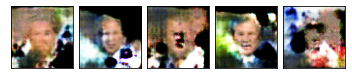

--- EPOCH 89/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.69it/s]
Discriminator loss: -0.767353920340538
Generator loss:     0.4753940522670746


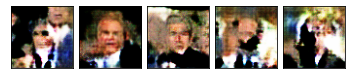

--- EPOCH 90/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.60it/s]
Discriminator loss: -0.7841797387599945
Generator loss:     0.4836278632283211


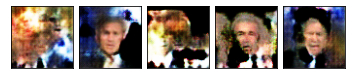

--- EPOCH 91/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.61it/s]
Discriminator loss: -0.7905470037460327
Generator loss:     0.47924721539020537


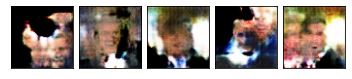

--- EPOCH 92/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.65it/s]
Discriminator loss: -0.7559874010086058
Generator loss:     0.4881681650876999


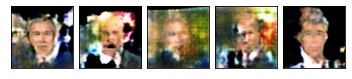

--- EPOCH 93/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.70it/s]
Discriminator loss: -0.7765581661462784
Generator loss:     0.4891549527645111


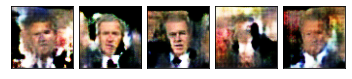

--- EPOCH 94/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.7662336361408233
Generator loss:     0.49594891667366026


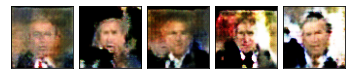

--- EPOCH 95/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.55it/s]
Discriminator loss: -0.7941412436962128
Generator loss:     0.5224226534366607


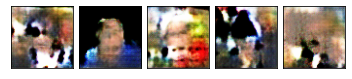

--- EPOCH 96/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.64it/s]
Discriminator loss: -0.7670578545331955
Generator loss:     0.4605727791786194


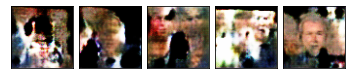

--- EPOCH 97/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.58it/s]
Discriminator loss: -0.7738583087921143
Generator loss:     0.46687120795249937


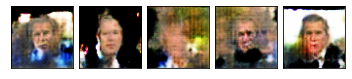

--- EPOCH 98/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.55it/s]
Discriminator loss: -0.7754648584127426
Generator loss:     0.5198211044073104


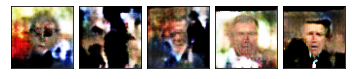

--- EPOCH 99/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -0.760257081091404
Generator loss:     0.4657728672027588


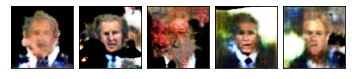

--- EPOCH 100/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.56it/s]
Discriminator loss: -0.7272288978099822
Generator loss:     0.5155785471200943


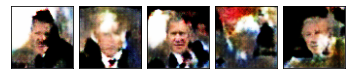

--- EPOCH 101/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.41it/s]
Discriminator loss: -0.7838931965827942
Generator loss:     0.45050078779459


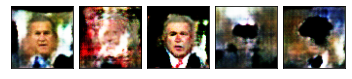

--- EPOCH 102/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.21it/s]
Discriminator loss: -0.7614997833967209
Generator loss:     0.4652304470539093


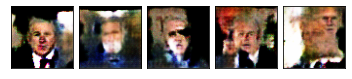

--- EPOCH 103/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -0.749622169137001
Generator loss:     0.4650451585650444


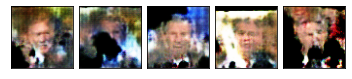

--- EPOCH 104/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.64it/s]
Discriminator loss: -0.7609110528230667
Generator loss:     0.47934427112340927


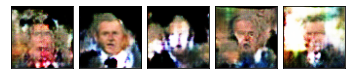

--- EPOCH 105/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.58it/s]
Discriminator loss: -0.7821437764167786
Generator loss:     0.5085039794445038


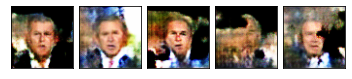

--- EPOCH 106/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.69it/s]
Discriminator loss: -0.7585391366481781
Generator loss:     0.41926213055849076


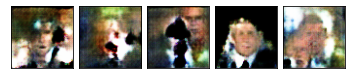

--- EPOCH 107/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.55it/s]
Discriminator loss: -0.766626170873642
Generator loss:     0.4438207820057869


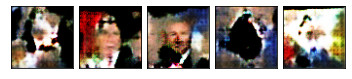

--- EPOCH 108/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.62it/s]
Discriminator loss: -0.7341096353530884
Generator loss:     0.4746146038174629


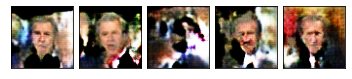

--- EPOCH 109/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.65it/s]
Discriminator loss: -0.7518003714084625
Generator loss:     0.47989542186260226


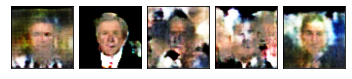

--- EPOCH 110/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.58it/s]
Discriminator loss: -0.7525869745016098
Generator loss:     0.4824685722589493


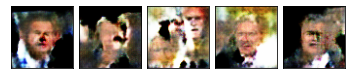

--- EPOCH 111/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.61it/s]
Discriminator loss: -0.7854981416463852
Generator loss:     0.48066103309392927


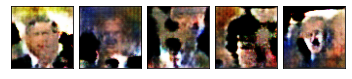

--- EPOCH 112/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.60it/s]
Discriminator loss: -0.7313864701986313
Generator loss:     0.4175811141729355


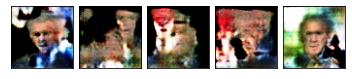

--- EPOCH 113/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.63it/s]
Discriminator loss: -0.7380403482913971
Generator loss:     0.48503691256046294


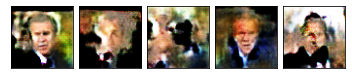

--- EPOCH 114/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.65it/s]
Discriminator loss: -0.7387351530790329
Generator loss:     0.45657691806554795


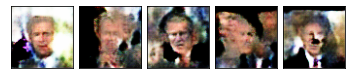

--- EPOCH 115/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.62it/s]
Discriminator loss: -0.7625751721858978
Generator loss:     0.475801382958889


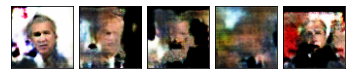

--- EPOCH 116/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.70it/s]
Discriminator loss: -0.757136446237564
Generator loss:     0.474607327580452


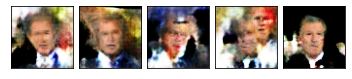

--- EPOCH 117/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.61it/s]
Discriminator loss: -0.7547742384672165
Generator loss:     0.4974054753780365


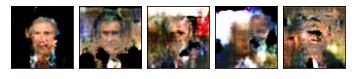

--- EPOCH 118/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.7611954039335251
Generator loss:     0.46505466252565386


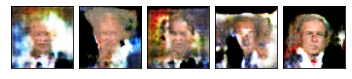

--- EPOCH 119/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.60it/s]
Discriminator loss: -0.7569342964887619
Generator loss:     0.4911609381437302


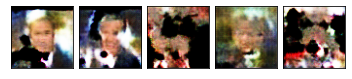

--- EPOCH 120/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -0.7536371451616286
Generator loss:     0.4598363369703293


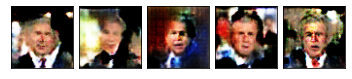

--- EPOCH 121/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.62it/s]
Discriminator loss: -0.7691983217000962
Generator loss:     0.436695496737957


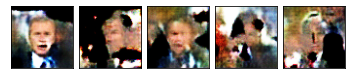

--- EPOCH 122/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.61it/s]
Discriminator loss: -0.755066487789154
Generator loss:     0.47232137322425843


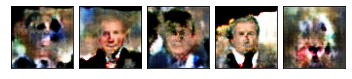

--- EPOCH 123/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.54it/s]
Discriminator loss: -0.7241058743000031
Generator loss:     0.4592379301786423


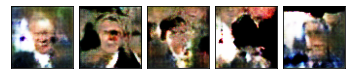

--- EPOCH 124/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.51it/s]
Discriminator loss: -0.7482686322927475
Generator loss:     0.45394907146692276


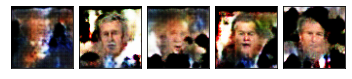

--- EPOCH 125/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.61it/s]
Discriminator loss: -0.7520818126201629
Generator loss:     0.4361364901065826


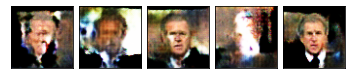

--- EPOCH 126/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
Discriminator loss: -0.7388646578788758
Generator loss:     0.4779631748795509


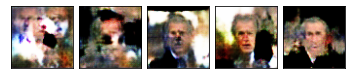

--- EPOCH 127/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.62it/s]
Discriminator loss: -0.7600815957784653
Generator loss:     0.49147127866744994


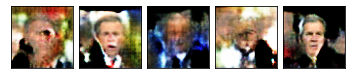

--- EPOCH 128/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.7549865418672562
Generator loss:     0.41785135194659234


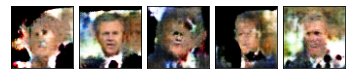

--- EPOCH 129/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.64it/s]
Discriminator loss: -0.7482372272014619
Generator loss:     0.44524863064289094


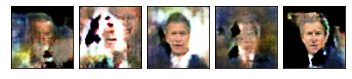

--- EPOCH 130/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.64it/s]
Discriminator loss: -0.72369926571846
Generator loss:     0.4474056750535965


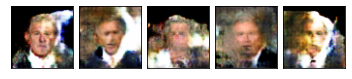

--- EPOCH 131/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -0.7235853439569474
Generator loss:     0.4660500049591064


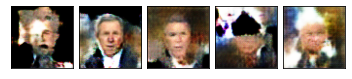

--- EPOCH 132/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.63it/s]
Discriminator loss: -0.7519479763507843
Generator loss:     0.43589736968278886


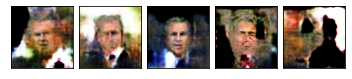

--- EPOCH 133/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.64it/s]
Discriminator loss: -0.7298630738258362
Generator loss:     0.47281502187252045


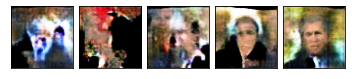

--- EPOCH 134/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.7473002433776855
Generator loss:     0.49071983695030214


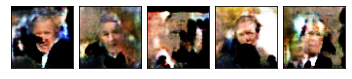

--- EPOCH 135/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.70it/s]
Discriminator loss: -0.7365989303588868
Generator loss:     0.468222314119339


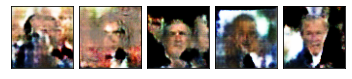

--- EPOCH 136/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.58it/s]
Discriminator loss: -0.7555694913864136
Generator loss:     0.41486072540283203


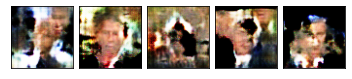

--- EPOCH 137/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -0.7117564916610718
Generator loss:     0.4543795377016068


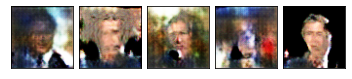

--- EPOCH 138/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.70it/s]
Discriminator loss: -0.7271683290600777
Generator loss:     0.3891096070408821


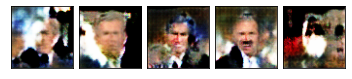

--- EPOCH 139/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.59it/s]
Discriminator loss: -0.7411501461267471
Generator loss:     0.4481206014752388


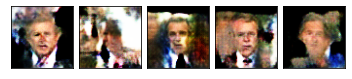

--- EPOCH 140/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.71it/s]
Discriminator loss: -0.7260115146636963
Generator loss:     0.456996513903141


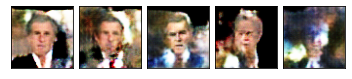

--- EPOCH 141/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.63it/s]
Discriminator loss: -0.7232964819669723
Generator loss:     0.4273203507065773


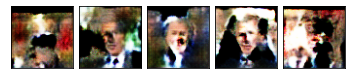

--- EPOCH 142/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -0.7306123596429825
Generator loss:     0.4681564748287201


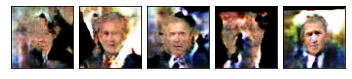

--- EPOCH 143/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.63it/s]
Discriminator loss: -0.7442391151189804
Generator loss:     0.4622750669717789


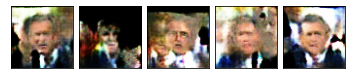

--- EPOCH 144/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.65it/s]
Discriminator loss: -0.7245579558610916
Generator loss:     0.43573669642210006


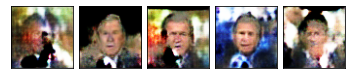

--- EPOCH 145/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
Discriminator loss: -0.7504979997873306
Generator loss:     0.41875428408384324


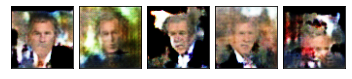

--- EPOCH 146/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.58it/s]
Discriminator loss: -0.7655615478754043
Generator loss:     0.4583927899599075


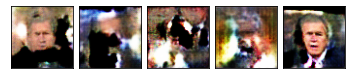

--- EPOCH 147/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.59it/s]
Discriminator loss: -0.717730079293251
Generator loss:     0.4218703268095851


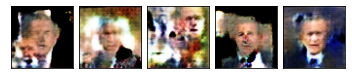

--- EPOCH 148/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.60it/s]
Discriminator loss: -0.7374017128348351
Generator loss:     0.4526028774678707


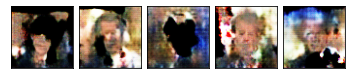

--- EPOCH 149/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.61it/s]
Discriminator loss: -0.7331956285238266
Generator loss:     0.3613595701754093


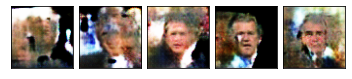

--- EPOCH 150/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.51it/s]
Discriminator loss: -0.7109624913334847
Generator loss:     0.47008329927921294


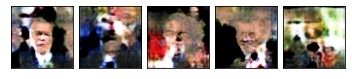

--- EPOCH 151/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.49it/s]
Discriminator loss: -0.7181725895404815
Generator loss:     0.4441454827785492


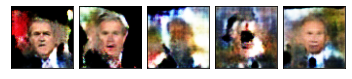

--- EPOCH 152/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.7442307925224304
Generator loss:     0.45335565507411957


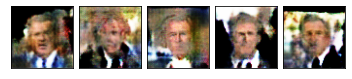

--- EPOCH 153/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.58it/s]
Discriminator loss: -0.7305093175172807
Generator loss:     0.4455281957983971


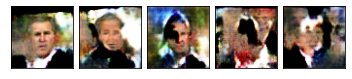

--- EPOCH 154/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.63it/s]
Discriminator loss: -0.7275652319192887
Generator loss:     0.4398687809705734


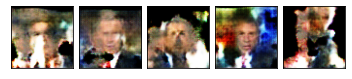

--- EPOCH 155/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.61it/s]
Discriminator loss: -0.7132944113016129
Generator loss:     0.43090098947286604


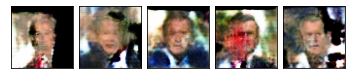

--- EPOCH 156/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.45it/s]
Discriminator loss: -0.7415874016284942
Generator loss:     0.4696917153894901


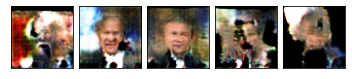

--- EPOCH 157/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.63it/s]
Discriminator loss: -0.7211647069454192
Generator loss:     0.41383529603481295


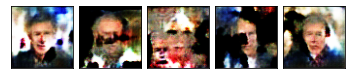

--- EPOCH 158/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.64it/s]
Discriminator loss: -0.7255423563718796
Generator loss:     0.450023153424263


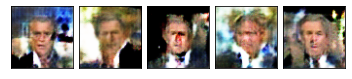

--- EPOCH 159/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.7195152670145035
Generator loss:     0.470741006731987


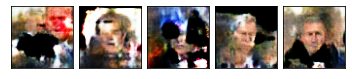

--- EPOCH 160/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.65it/s]
Discriminator loss: -0.7344175082445145
Generator loss:     0.4639867812395096


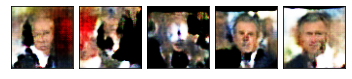

--- EPOCH 161/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.59it/s]
Discriminator loss: -0.7425960558652878
Generator loss:     0.45041694641113283


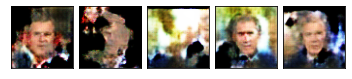

--- EPOCH 162/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.23it/s]
Discriminator loss: -0.7194746118783951
Generator loss:     0.4397580876946449


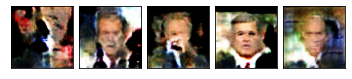

--- EPOCH 163/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.62it/s]
Discriminator loss: -0.7187183636426925
Generator loss:     0.4705639183521271


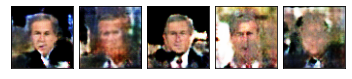

--- EPOCH 164/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.63it/s]
Discriminator loss: -0.7372183167934419
Generator loss:     0.4603532701730728


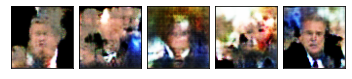

--- EPOCH 165/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.7129724347591401
Generator loss:     0.4539356380701065


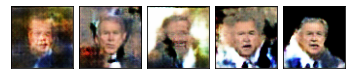

--- EPOCH 166/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
Discriminator loss: -0.7455743765830994
Generator loss:     0.4622662663459778


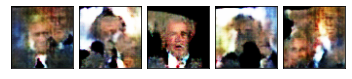

--- EPOCH 167/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.7350466307997704
Generator loss:     0.4288967944681644


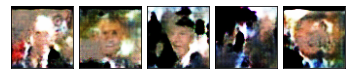

--- EPOCH 168/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.60it/s]
Discriminator loss: -0.7415653157234192
Generator loss:     0.4514389425516129


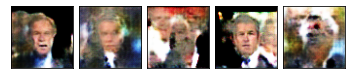

--- EPOCH 169/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -0.698715396821499
Generator loss:     0.36056710928678515


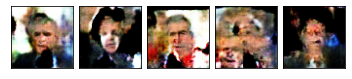

--- EPOCH 170/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.62it/s]
Discriminator loss: -0.7144824665784836
Generator loss:     0.43785045146942136


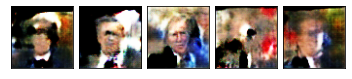

--- EPOCH 171/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.7190716648101806
Generator loss:     0.40983819738030436


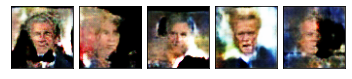

--- EPOCH 172/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -0.7184410291910173
Generator loss:     0.4195840433239937


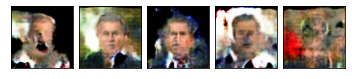

--- EPOCH 173/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.47it/s]
Discriminator loss: -0.7372012788057327
Generator loss:     0.43723884373903277


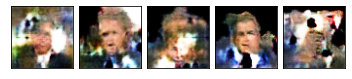

--- EPOCH 174/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.70it/s]
Discriminator loss: -0.7262846422195434
Generator loss:     0.43073921501636503


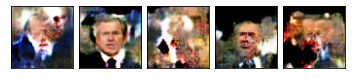

--- EPOCH 175/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.61it/s]
Discriminator loss: -0.7389090985059737
Generator loss:     0.47325277924537656


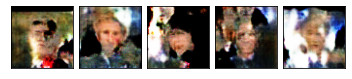

--- EPOCH 176/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.55it/s]
Discriminator loss: -0.7013026860356331
Generator loss:     0.37131883166730406


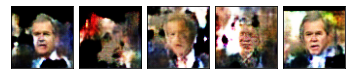

--- EPOCH 177/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.64it/s]
Discriminator loss: -0.705419109761715
Generator loss:     0.4261843293905258


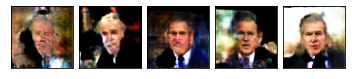

--- EPOCH 178/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.7214449387788773
Generator loss:     0.45013072788715364


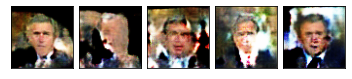

--- EPOCH 179/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.61it/s]
Discriminator loss: -0.728197391629219
Generator loss:     0.36461069211363795


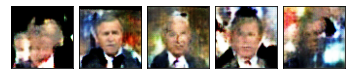

--- EPOCH 180/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.62it/s]
Discriminator loss: -0.6894051325321198
Generator loss:     0.41150220595300196


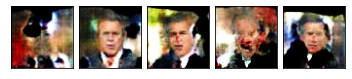

--- EPOCH 181/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.70it/s]
Discriminator loss: -0.7155156296491623
Generator loss:     0.47674844712018966


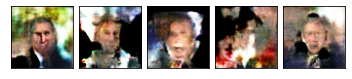

--- EPOCH 182/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.45it/s]
Discriminator loss: -0.710265600681305
Generator loss:     0.3495547235012054


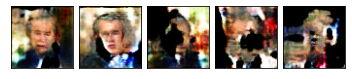

--- EPOCH 183/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.61it/s]
Discriminator loss: -0.7406580871343613
Generator loss:     0.4234855681657791


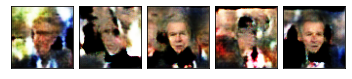

--- EPOCH 184/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.81it/s]
Discriminator loss: -0.6961698800325393
Generator loss:     0.42298375964164736


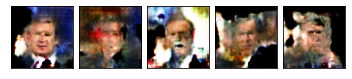

--- EPOCH 185/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.80it/s]
Discriminator loss: -0.7127380430698395
Generator loss:     0.42928390502929686


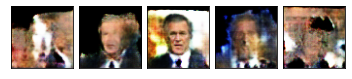

--- EPOCH 186/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.79it/s]
Discriminator loss: -0.6991080403327942
Generator loss:     0.4456049606204033


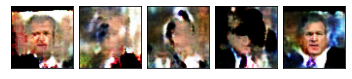

--- EPOCH 187/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.71it/s]
Discriminator loss: -0.709825177192688
Generator loss:     0.43865724205970763


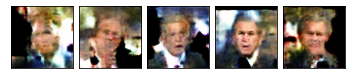

--- EPOCH 188/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.79it/s]
Discriminator loss: -0.7277637022733688
Generator loss:     0.3873713299632072


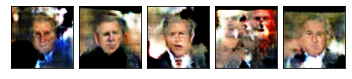

--- EPOCH 189/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.69it/s]
Discriminator loss: -0.7165420472621917
Generator loss:     0.4584123849868774


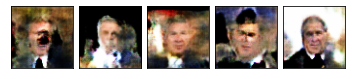

--- EPOCH 190/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.75it/s]
Discriminator loss: -0.7096968132257462
Generator loss:     0.44156368970870974


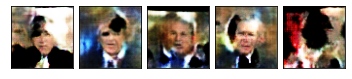

--- EPOCH 191/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.82it/s]
Discriminator loss: -0.6958626413345337
Generator loss:     0.41095907166600226


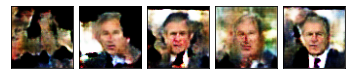

--- EPOCH 192/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.7404459476470947
Generator loss:     0.4283851653337479


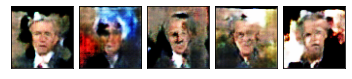

--- EPOCH 193/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.78it/s]
Discriminator loss: -0.7008944138884544
Generator loss:     0.3753901317715645


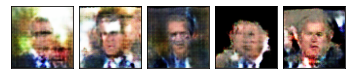

--- EPOCH 194/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.76it/s]
Discriminator loss: -0.6927882117033005
Generator loss:     0.40263075903058054


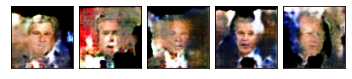

--- EPOCH 195/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.81it/s]
Discriminator loss: -0.7036737370491029
Generator loss:     0.43770154342055323


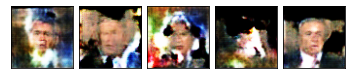

--- EPOCH 196/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.72it/s]
Discriminator loss: -0.6951518672704696
Generator loss:     0.3829444795846939


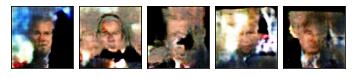

--- EPOCH 197/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.76it/s]
Discriminator loss: -0.7151352596282959
Generator loss:     0.44282105267047883


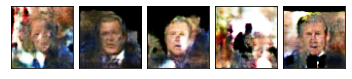

--- EPOCH 198/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.79it/s]
Discriminator loss: -0.7038098043203354
Generator loss:     0.4522648736834526


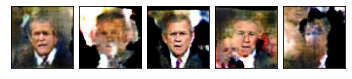

--- EPOCH 199/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.7309451407194137
Generator loss:     0.36596031710505483


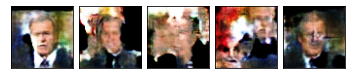

--- EPOCH 200/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.63it/s]
Discriminator loss: -0.7007924640178681
Generator loss:     0.43914449512958526


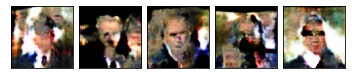

--- EPOCH 201/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.75it/s]
Discriminator loss: -0.7102833235263825
Generator loss:     0.3769970953464508


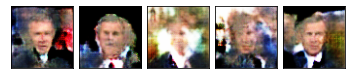

--- EPOCH 202/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.75it/s]
Discriminator loss: -0.7208184885978699
Generator loss:     0.44303442239761354


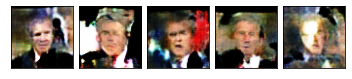

--- EPOCH 203/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.71it/s]
Discriminator loss: -0.6806387275457382
Generator loss:     0.42534527331590655


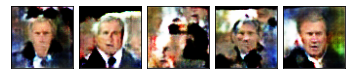

--- EPOCH 204/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.6993474271893502
Generator loss:     0.376098713837564


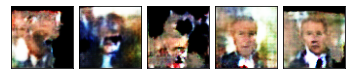

--- EPOCH 205/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.77it/s]
Discriminator loss: -0.7060284799337387
Generator loss:     0.38618940860033035


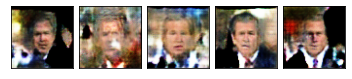

--- EPOCH 206/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.72it/s]
Discriminator loss: -0.7061758568882943
Generator loss:     0.4083200260996819


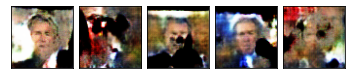

--- EPOCH 207/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.81it/s]
Discriminator loss: -0.7105149185657502
Generator loss:     0.4131194815039635


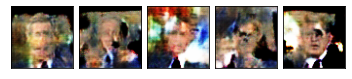

--- EPOCH 208/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.7051854085922241
Generator loss:     0.4076687142252922


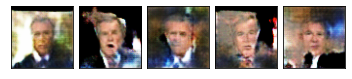

--- EPOCH 209/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -0.7044241809844969
Generator loss:     0.4566642984747887


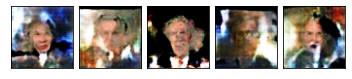

--- EPOCH 210/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.83it/s]
Discriminator loss: -0.6998805284500123
Generator loss:     0.4342285394668579


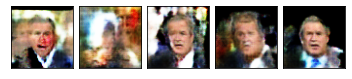

--- EPOCH 211/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.74it/s]
Discriminator loss: -0.6821146696805953
Generator loss:     0.3899838551878929


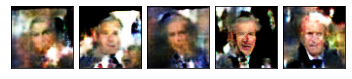

--- EPOCH 212/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.82it/s]
Discriminator loss: -0.7124943202733993
Generator loss:     0.39621644616127016


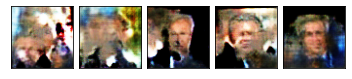

--- EPOCH 213/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.72it/s]
Discriminator loss: -0.7225280442833901
Generator loss:     0.43236525505781176


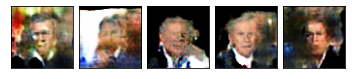

--- EPOCH 214/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.79it/s]
Discriminator loss: -0.6966322779655456
Generator loss:     0.4174017280340195


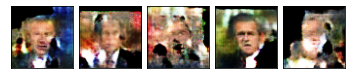

--- EPOCH 215/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.72it/s]
Discriminator loss: -0.6941083836555481
Generator loss:     0.42656719088554385


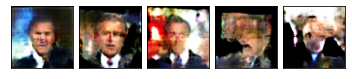

--- EPOCH 216/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.79it/s]
Discriminator loss: -0.6992682123184204
Generator loss:     0.42624000608921053


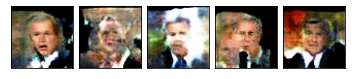

--- EPOCH 217/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.75it/s]
Discriminator loss: -0.7114030095934867
Generator loss:     0.3996300496160984


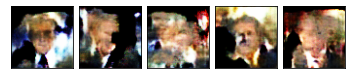

--- EPOCH 218/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.60it/s]
Discriminator loss: -0.6639866301417351
Generator loss:     0.3532461442053318


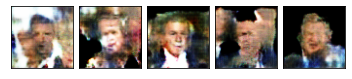

--- EPOCH 219/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.81it/s]
Discriminator loss: -0.6972422963380813
Generator loss:     0.3717317976057529


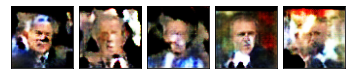

--- EPOCH 220/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.69it/s]
Discriminator loss: -0.6965186840295792
Generator loss:     0.42336641401052477


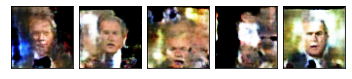

--- EPOCH 221/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.83it/s]
Discriminator loss: -0.6942567747831344
Generator loss:     0.4406970277428627


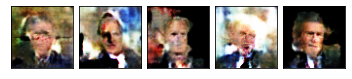

--- EPOCH 222/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.69it/s]
Discriminator loss: -0.7149914121627808
Generator loss:     0.41572319716215134


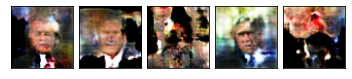

--- EPOCH 223/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.82it/s]
Discriminator loss: -0.7035597547888756
Generator loss:     0.41192977130413055


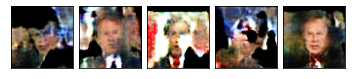

--- EPOCH 224/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.79it/s]
Discriminator loss: -0.730092903971672
Generator loss:     0.40863808393478396


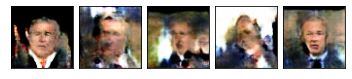

--- EPOCH 225/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.78it/s]
Discriminator loss: -0.6828870508074761
Generator loss:     0.3117587506771088


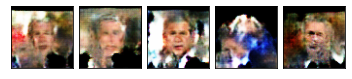

--- EPOCH 226/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.76it/s]
Discriminator loss: -0.7004740744829178
Generator loss:     0.47007820308208464


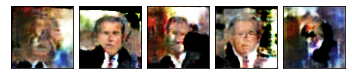

--- EPOCH 227/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
Discriminator loss: -0.6938108026981353
Generator loss:     0.4004105031490326


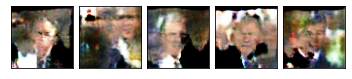

--- EPOCH 228/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.84it/s]
Discriminator loss: -0.7076243788003922
Generator loss:     0.38609697446227076


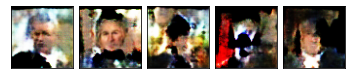

--- EPOCH 229/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.78it/s]
Discriminator loss: -0.6874237644672393
Generator loss:     0.4157335489988327


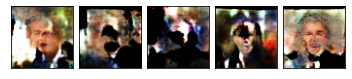

--- EPOCH 230/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.75it/s]
Discriminator loss: -0.6991934037208557
Generator loss:     0.3905342876911163


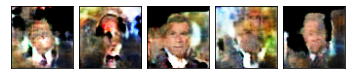

--- EPOCH 231/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.59it/s]
Discriminator loss: -0.7183485680818558
Generator loss:     0.42933038920164107


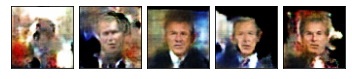

--- EPOCH 232/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.72it/s]
Discriminator loss: -0.6964477914571763
Generator loss:     0.39125668704509736


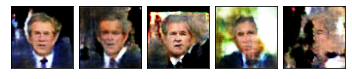

--- EPOCH 233/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.83it/s]
Discriminator loss: -0.6998834055662156
Generator loss:     0.36628240793943406


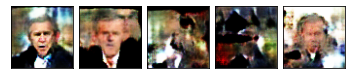

--- EPOCH 234/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.72it/s]
Discriminator loss: -0.6765205505490304
Generator loss:     0.3643558081239462


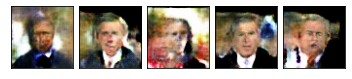

--- EPOCH 235/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.72it/s]
Discriminator loss: -0.6978987860679627
Generator loss:     0.41135109048336743


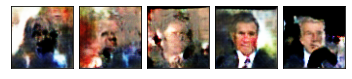

--- EPOCH 236/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.75it/s]
Discriminator loss: -0.6930559337139129
Generator loss:     0.3965190023183823


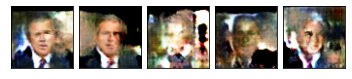

--- EPOCH 237/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.84it/s]
Discriminator loss: -0.6885657823085785
Generator loss:     0.42022364735603335


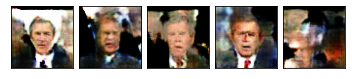

--- EPOCH 238/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.80it/s]
Discriminator loss: -0.687657846212387
Generator loss:     0.44671405479311943


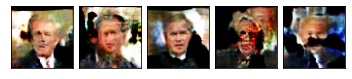

--- EPOCH 239/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.70it/s]
Discriminator loss: -0.6873891013860702
Generator loss:     0.3930938273668289


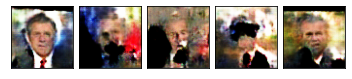

--- EPOCH 240/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.77it/s]
Discriminator loss: -0.7056293591856956
Generator loss:     0.34699328765273096


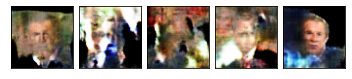

--- EPOCH 241/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.70it/s]
Discriminator loss: -0.6933799153566361
Generator loss:     0.43652876615524294


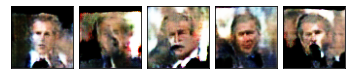

--- EPOCH 242/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.86it/s]
Discriminator loss: -0.6930443906784058
Generator loss:     0.3656977482140064


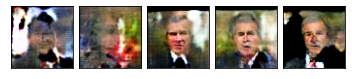

--- EPOCH 243/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.73it/s]
Discriminator loss: -0.6951660805940628
Generator loss:     0.4532812349498272


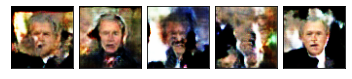

--- EPOCH 244/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.72it/s]
Discriminator loss: -0.6847219604253769
Generator loss:     0.4121101930737495


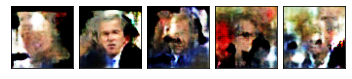

--- EPOCH 245/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.74it/s]
Discriminator loss: -0.6962770956754685
Generator loss:     0.4130667433142662


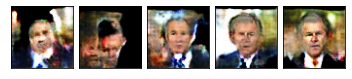

--- EPOCH 246/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.73it/s]
Discriminator loss: -0.7158222007751465
Generator loss:     0.38524108231067655


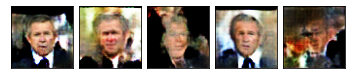

--- EPOCH 247/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.79it/s]
Discriminator loss: -0.7028014928102493
Generator loss:     0.40388994216918944


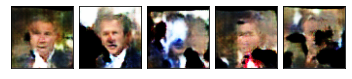

--- EPOCH 248/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.71it/s]
Discriminator loss: -0.7038435912132264
Generator loss:     0.4155367247760296


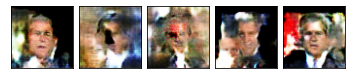

--- EPOCH 249/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.83it/s]
Discriminator loss: -0.6759600526094436
Generator loss:     0.39215519642457364


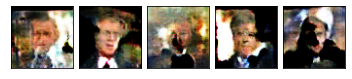

--- EPOCH 250/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.73it/s]
Discriminator loss: -0.7054226738214493
Generator loss:     0.4374094307422638


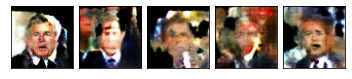

--- EPOCH 251/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.75it/s]
Discriminator loss: -0.6820333561301232
Generator loss:     0.38445314988493917


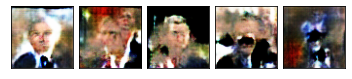

--- EPOCH 252/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.79it/s]
Discriminator loss: -0.6824183028936386
Generator loss:     0.38109384179115297


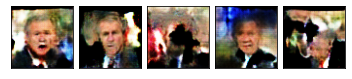

--- EPOCH 253/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -0.6922524875402452
Generator loss:     0.4072048678994179


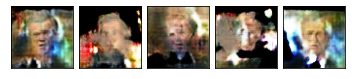

--- EPOCH 254/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.85it/s]
Discriminator loss: -0.6834961885213853
Generator loss:     0.4363533243536949


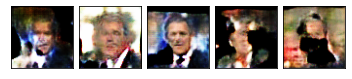

--- EPOCH 255/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.69it/s]
Discriminator loss: -0.7079459175467491
Generator loss:     0.38420243561267853


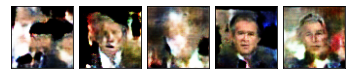

--- EPOCH 256/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.82it/s]
Discriminator loss: -0.686565523147583
Generator loss:     0.3927143506705761


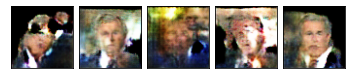

--- EPOCH 257/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.81it/s]
Discriminator loss: -0.6944097220897674
Generator loss:     0.3903772642835975


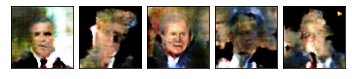

--- EPOCH 258/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.65it/s]
Discriminator loss: -0.6696848174929619
Generator loss:     0.3782122239470482


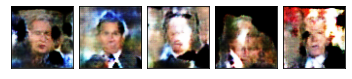

--- EPOCH 259/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.79it/s]
Discriminator loss: -0.7171594595909119
Generator loss:     0.41768358200788497


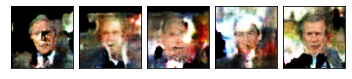

--- EPOCH 260/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.71it/s]
Discriminator loss: -0.7001589810848236
Generator loss:     0.37707448601722715


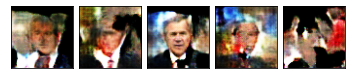

--- EPOCH 261/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.77it/s]
Discriminator loss: -0.6994434478878974
Generator loss:     0.43564408719539643


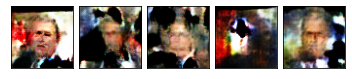

--- EPOCH 262/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -0.6881711053848266
Generator loss:     0.4050189971923828


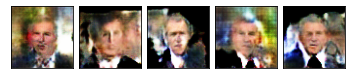

--- EPOCH 263/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.81it/s]
Discriminator loss: -0.6959667122364045
Generator loss:     0.40829900205135344


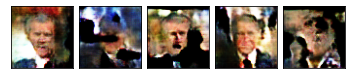

--- EPOCH 264/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.77it/s]
Discriminator loss: -0.7035830876231193
Generator loss:     0.37273128405213357


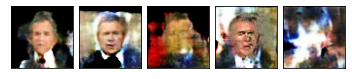

--- EPOCH 265/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.81it/s]
Discriminator loss: -0.6528992176055908
Generator loss:     0.3943698287010193


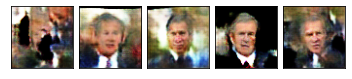

--- EPOCH 266/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.81it/s]
Discriminator loss: -0.6934359949827194
Generator loss:     0.362231432646513


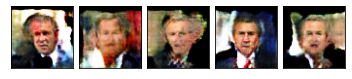

--- EPOCH 267/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.79it/s]
Discriminator loss: -0.6879587161540985
Generator loss:     0.41035258024930954


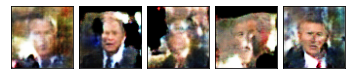

--- EPOCH 268/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.80it/s]
Discriminator loss: -0.6786763048171996
Generator loss:     0.348299939930439


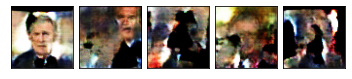

--- EPOCH 269/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.72it/s]
Discriminator loss: -0.6872060948610306
Generator loss:     0.4108163610100746


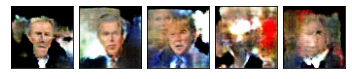

--- EPOCH 270/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.79it/s]
Discriminator loss: -0.6924347585439683
Generator loss:     0.3556537453085184


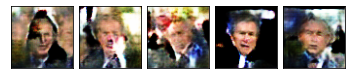

--- EPOCH 271/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.72it/s]
Discriminator loss: -0.6894940763711929
Generator loss:     0.46237950325012206


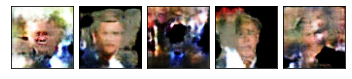

--- EPOCH 272/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -0.6893534934520722
Generator loss:     0.3273994781076908


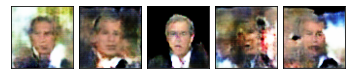

--- EPOCH 273/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.80it/s]
Discriminator loss: -0.6973993468284607
Generator loss:     0.38598170056939124


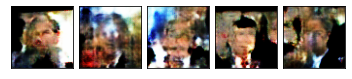

--- EPOCH 274/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.76it/s]
Discriminator loss: -0.6682760351896286
Generator loss:     0.40729840695858


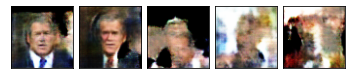

--- EPOCH 275/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.73it/s]
Discriminator loss: -0.6996858894824982
Generator loss:     0.4035699635744095


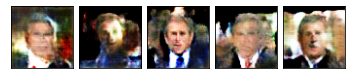

--- EPOCH 276/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.73it/s]
Discriminator loss: -0.6786527806520463
Generator loss:     0.3277401336468756


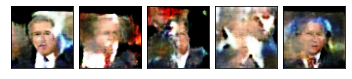

--- EPOCH 277/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.78it/s]
Discriminator loss: -0.6723896604776382
Generator loss:     0.348841992020607


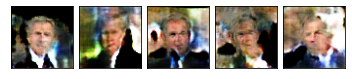

--- EPOCH 278/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.65it/s]
Discriminator loss: -0.6886540967226027
Generator loss:     0.4183429852128029


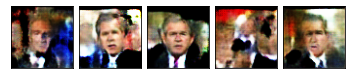

--- EPOCH 279/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.72it/s]
Discriminator loss: -0.702731236219406
Generator loss:     0.37505158022977414


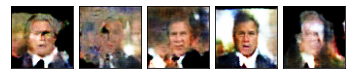

--- EPOCH 280/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.71it/s]
Discriminator loss: -0.684115229845047
Generator loss:     0.39692107290029527


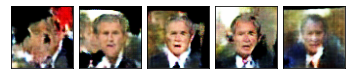

--- EPOCH 281/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.70it/s]
Discriminator loss: -0.6951549011468887
Generator loss:     0.4196742758154869


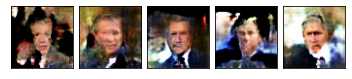

--- EPOCH 282/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.86it/s]
Discriminator loss: -0.6920464795827865
Generator loss:     0.405777245759964


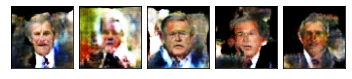

--- EPOCH 283/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
Discriminator loss: -0.6853578937053679
Generator loss:     0.38531563654541967


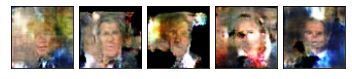

--- EPOCH 284/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.81it/s]
Discriminator loss: -0.6819926911592482
Generator loss:     0.40404499173164365


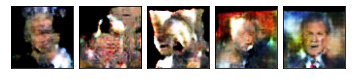

--- EPOCH 285/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.6960753381252288
Generator loss:     0.3614848077297211


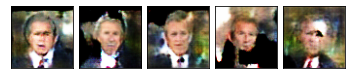

--- EPOCH 286/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.76it/s]
Discriminator loss: -0.6976743656396867
Generator loss:     0.4021817915141582


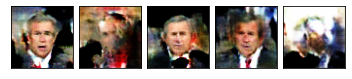

--- EPOCH 287/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.76it/s]
Discriminator loss: -0.6830151721835136
Generator loss:     0.39646092653274534


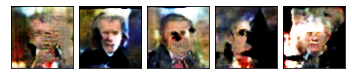

--- EPOCH 288/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
Discriminator loss: -0.6927688628435136
Generator loss:     0.42027858197689055


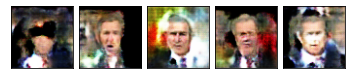

--- EPOCH 289/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.81it/s]
Discriminator loss: -0.69907420784235
Generator loss:     0.3729792766273022


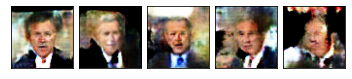

--- EPOCH 290/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.75it/s]
Discriminator loss: -0.7051015442609787
Generator loss:     0.34152872692793607


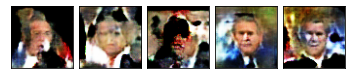

--- EPOCH 291/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.83it/s]
Discriminator loss: -0.7015919345617294
Generator loss:     0.3643259987235069


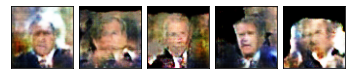

--- EPOCH 292/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
Discriminator loss: -0.6901685583591461
Generator loss:     0.380973282456398


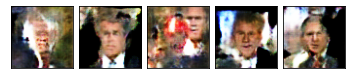

--- EPOCH 293/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.79it/s]
Discriminator loss: -0.6780045703053473
Generator loss:     0.3780734270811081


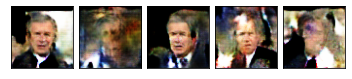

--- EPOCH 294/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.69it/s]
Discriminator loss: -0.6810159638524056
Generator loss:     0.385121563076973


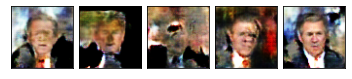

--- EPOCH 295/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.79it/s]
Discriminator loss: -0.6857851612567901
Generator loss:     0.3701964825391769


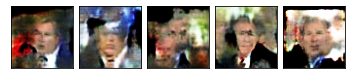

--- EPOCH 296/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.85it/s]
Discriminator loss: -0.6871179634332656
Generator loss:     0.36318044662475585


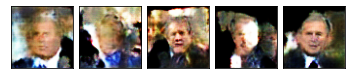

--- EPOCH 297/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.71it/s]
Discriminator loss: -0.694424546957016
Generator loss:     0.4229132689535618


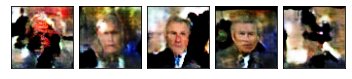

--- EPOCH 298/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.83it/s]
Discriminator loss: -0.6731623226404191
Generator loss:     0.38437061607837675


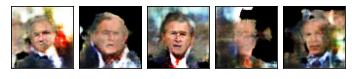

--- EPOCH 299/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.72it/s]
Discriminator loss: -0.6937932670116425
Generator loss:     0.3174660206772387


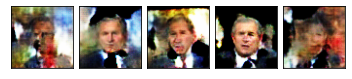

--- EPOCH 300/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.84it/s]
Discriminator loss: -0.6584426319599151
Generator loss:     0.40219565480947495


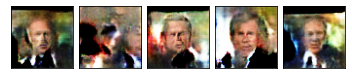

--- EPOCH 301/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.72it/s]
Discriminator loss: -0.6815738779306413
Generator loss:     0.38140241950750353


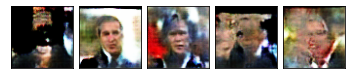

--- EPOCH 302/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.74it/s]
Discriminator loss: -0.6959553164243698
Generator loss:     0.41116980612277987


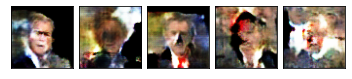

--- EPOCH 303/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.76it/s]
Discriminator loss: -0.6959530425071716
Generator loss:     0.3824662551283836


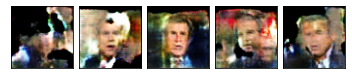

--- EPOCH 304/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.71it/s]
Discriminator loss: -0.6822886222600937
Generator loss:     0.3888543605804443


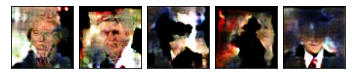

--- EPOCH 305/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.81it/s]
Discriminator loss: -0.650589478611946
Generator loss:     0.3620845079421997


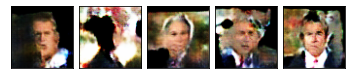

--- EPOCH 306/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.63it/s]
Discriminator loss: -0.6791815054416657
Generator loss:     0.4071199342608452


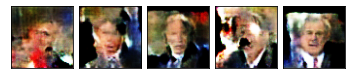

--- EPOCH 307/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.79it/s]
Discriminator loss: -0.6889145714044571
Generator loss:     0.4027507185935974


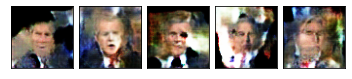

--- EPOCH 308/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.71it/s]
Discriminator loss: -0.6931822872161864
Generator loss:     0.3413929305970669


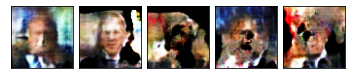

--- EPOCH 309/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.78it/s]
Discriminator loss: -0.6803029489517212
Generator loss:     0.4013173162937164


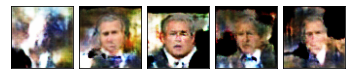

--- EPOCH 310/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.76it/s]
Discriminator loss: -0.6758458736538888
Generator loss:     0.3689036682248116


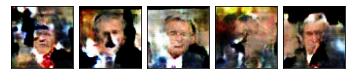

--- EPOCH 311/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.74it/s]
Discriminator loss: -0.6955655294656753
Generator loss:     0.4062704585492611


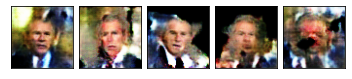

--- EPOCH 312/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.85it/s]
Discriminator loss: -0.6834123259782791
Generator loss:     0.40575976520776746


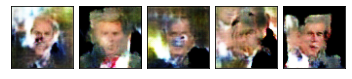

--- EPOCH 313/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.60it/s]
Discriminator loss: -0.6787790757417679
Generator loss:     0.3814143821597099


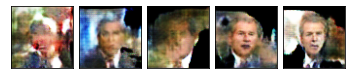

--- EPOCH 314/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.76it/s]
Discriminator loss: -0.6763072144985199
Generator loss:     0.4229108735918999


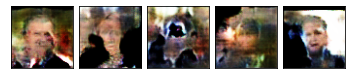

--- EPOCH 315/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.62it/s]
Discriminator loss: -0.6706213602423667
Generator loss:     0.3714326560497284


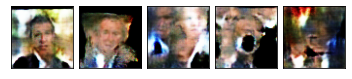

--- EPOCH 316/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.76it/s]
Discriminator loss: -0.6740728646516799
Generator loss:     0.34114497639238833


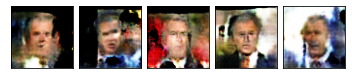

--- EPOCH 317/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.83it/s]
Discriminator loss: -0.6991798436641694
Generator loss:     0.40424942672252656


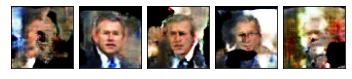

--- EPOCH 318/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -0.6725222694873809
Generator loss:     0.4076556652784348


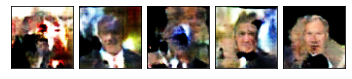

--- EPOCH 319/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.76it/s]
Discriminator loss: -0.6781500840187074
Generator loss:     0.3525941714644432


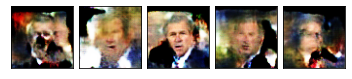

--- EPOCH 320/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.81it/s]
Discriminator loss: -0.6598892283439636
Generator loss:     0.3760872736573219


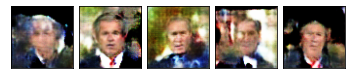

--- EPOCH 321/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.71it/s]
Discriminator loss: -0.685185963511467
Generator loss:     0.3843208208680153


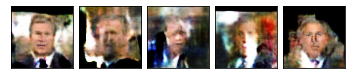

--- EPOCH 322/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.84it/s]
Discriminator loss: -0.6756665039062499
Generator loss:     0.3969174787402153


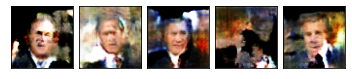

--- EPOCH 323/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.70it/s]
Discriminator loss: -0.680065787434578
Generator loss:     0.391287237405777


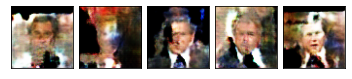

--- EPOCH 324/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.80it/s]
Discriminator loss: -0.6949440717697144
Generator loss:     0.4562410473823547


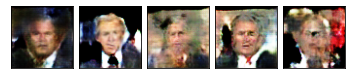

--- EPOCH 325/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.77it/s]
Discriminator loss: -0.6733953052759171
Generator loss:     0.4081905856728554


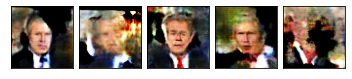

--- EPOCH 326/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.75it/s]
Discriminator loss: -0.6858549684286117
Generator loss:     0.3690780535340309


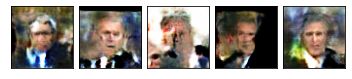

--- EPOCH 327/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.73it/s]
Discriminator loss: -0.668802074790001
Generator loss:     0.3268702238798141


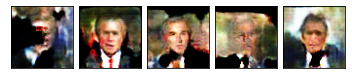

--- EPOCH 328/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
Discriminator loss: -0.6673984158039094
Generator loss:     0.387646596878767


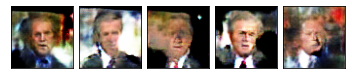

--- EPOCH 329/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.84it/s]
Discriminator loss: -0.6749613487720489
Generator loss:     0.38658349215984344


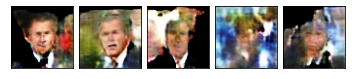

--- EPOCH 330/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.73it/s]
Discriminator loss: -0.7094857573509216
Generator loss:     0.3956929326057434


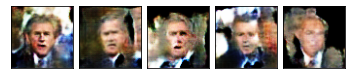

--- EPOCH 331/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.84it/s]
Discriminator loss: -0.6681895107030869
Generator loss:     0.3612922340631485


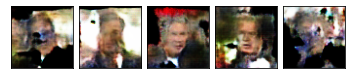

--- EPOCH 332/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
Discriminator loss: -0.6946038681268691
Generator loss:     0.4341829001903534


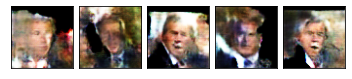

--- EPOCH 333/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.6475965440273284
Generator loss:     0.3598622277379036


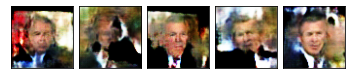

--- EPOCH 334/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.82it/s]
Discriminator loss: -0.677557709813118
Generator loss:     0.3939740374684334


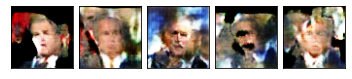

--- EPOCH 335/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.80it/s]
Discriminator loss: -0.685315283536911
Generator loss:     0.37656877040863035


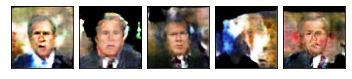

--- EPOCH 336/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.82it/s]
Discriminator loss: -0.6812147349119186
Generator loss:     0.4056544877588749


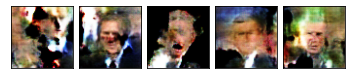

--- EPOCH 337/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.76it/s]
Discriminator loss: -0.669619197845459
Generator loss:     0.36958363801240923


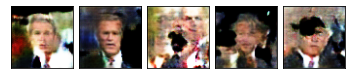

--- EPOCH 338/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.87it/s]
Discriminator loss: -0.6687336981296539
Generator loss:     0.37425406724214555


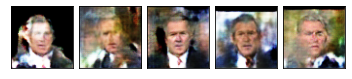

--- EPOCH 339/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.74it/s]
Discriminator loss: -0.6483593261241912
Generator loss:     0.34715442061424256


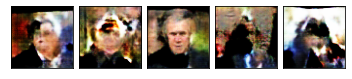

--- EPOCH 340/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.6917037385702133
Generator loss:     0.3880266822874546


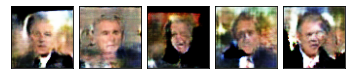

--- EPOCH 341/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
Discriminator loss: -0.6663087904453278
Generator loss:     0.3661541327834129


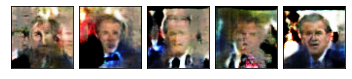

--- EPOCH 342/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.66it/s]
Discriminator loss: -0.672441498041153
Generator loss:     0.40018356740474703


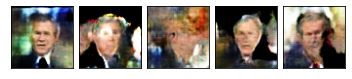

--- EPOCH 343/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.85it/s]
Discriminator loss: -0.6787514236569404
Generator loss:     0.3095410160720348


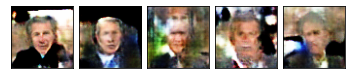

--- EPOCH 344/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.85it/s]
Discriminator loss: -0.6720700937509537
Generator loss:     0.3938217505812645


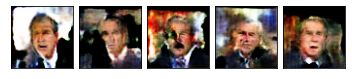

--- EPOCH 345/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.79it/s]
Discriminator loss: -0.6961039972305298
Generator loss:     0.3707470238208771


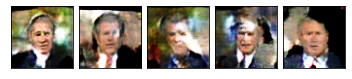

--- EPOCH 346/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.70it/s]
Discriminator loss: -0.6769413173198701
Generator loss:     0.3971517749130726


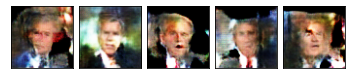

--- EPOCH 347/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.79it/s]
Discriminator loss: -0.6667878806591034
Generator loss:     0.3251605283468962


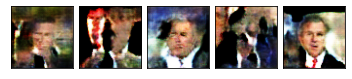

--- EPOCH 348/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.73it/s]
Discriminator loss: -0.6771180814504624
Generator loss:     0.407635934650898


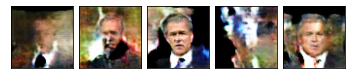

--- EPOCH 349/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.78it/s]
Discriminator loss: -0.685748621225357
Generator loss:     0.37169052064418795


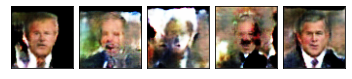

--- EPOCH 350/400 ---
100%|██████████| 10/10 [00:02<00:00,  4.74it/s]
Discriminator loss: -0.6865717619657516
Generator loss:     0.3668166592717171


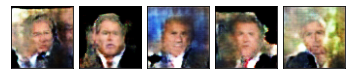

--- EPOCH 351/400 ---
 40%|████      | 4/10 [00:00<00:01,  4.82it/s]

In [ ]:
hp = wgan_hyperparams()
print(hp)
WGANTrainer(hp).train()

File /home/ofir.s/.pytorch-datasets/lfw-bush.zip exists, skipping download.
Extracting /home/ofir.s/.pytorch-datasets/lfw-bush.zip...
Extracted 531 to /home/ofir.s/.pytorch-datasets/lfw/George_W_Bush
Generator(
  (seq): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, mo

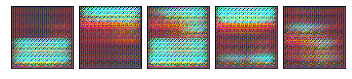

--- EPOCH 2/100 ---
100%|██████████| 9/9 [00:02<00:00,  4.17it/s]
Discriminator loss: -1.2187088926633198
Generator loss:     0.725561797618866


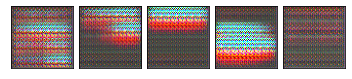

--- EPOCH 3/100 ---
 44%|████▍     | 4/9 [00:01<00:01,  3.43it/s]

 *** Training interrupted by user


In [5]:
from project.tomer_gan import *
from project.BushDataLoader import BushDataLoader
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
num_epochs=100
dl_train = BushDataLoader(64, shuffle=True)

wgan = W_Gan(device, disc_in_size=dl_train.im_size, z_dim=100, n_critic=5, weight_clip=0.01)
dsc_optimizer = torch.optim.RMSprop(wgan.dsc_model.parameters(), lr=5e-4)
gen_optimizer = torch.optim.RMSprop(wgan.gen_model.parameters(), lr=5e-4)
wgan.train(num_epochs, dl_train, dsc_optimizer, gen_optimizer)